In [2]:
import numpy as np
import pandas as pd
import os
import scipy.signal as signal
from tqdm import tqdm

# ---------------- 配置参数 ----------------
fs = 200e3           
L_payload = 1024     
L_sync = 512         
L_tag = 32           
jnrs = range(-10, 35, 5)  
samples_per_type = 1000 

class SuperSyncGenerator:
    def __init__(self, fs):
        self.fs = fs
        self.t_payload = np.arange(L_payload) / fs
        self.t_tag = np.arange(L_tag) / fs
        
        # 同步头：Chirp信号
        t_s = np.arange(L_sync) / fs
        sync = signal.chirp(t_s, f0=-90e3, f1=90e3, t1=L_sync/fs, method='linear')
        self.sync_head = (sync * np.hamming(L_sync)).astype(np.complex64) * 2.5 

    def gen_tag_pilot(self, type_idx):
        # 物理标签：通过频率偏移区分样式
        f_tag = (type_idx + 1) * 10e3  
        tag = np.exp(1j * 2 * np.pi * f_tag * self.t_tag).astype(np.complex64) * 1.5
        return tag

    def gen_satellite_background(self):
        """生成卫星BPSK跳频通信信号作为背景"""
        f_hop = np.random.choice([15e3, 40e3, -10e3, 60e3, -30e3])
        bits = np.sign(np.random.randn(L_payload // 8))
        symbols = np.repeat(bits, 8)[:L_payload]
        sat_sig = symbols * np.exp(1j * 2 * np.pi * f_hop * self.t_payload)
        return sat_sig, f_hop, 25e3 # 假设跳频带宽为25kHz

    def gen_interference(self, i_type):
        """生成各类干扰信号并返回其物理真值"""
        f0 = np.random.uniform(-75e3, 75e3)
        bw = 0
        sig = np.zeros(L_payload, dtype=np.complex64)
        
        if i_type == "SingleTone":
            sig = np.exp(1j * 2 * np.pi * f0 * self.t_payload)
            bw = 500
        elif i_type == "Chirp":
            bw = np.random.uniform(40e3, 80e3)
            sig = np.exp(1j * (np.pi * (bw/(L_payload/self.fs)) * self.t_payload**2 + 2*np.pi*f0*self.t_payload))
        elif i_type == "Pulse":
            bw = 45e3
            mask = (np.mod(self.t_payload, 0.003) < 0.0012).astype(float)
            sig = mask * np.exp(1j * 2 * np.pi * f0 * self.t_payload)
        elif i_type == "HoppingJam":
            bw = 85e3
            num_hops = 4 
            pts = L_payload // num_hops
            for i in range(num_hops):
                fh = np.random.uniform(-85e3, 85e3)
                sig[i*pts : (i+1)*pts] = np.exp(1j * 2 * np.pi * fh * self.t_payload[i*pts : (i+1)*pts])
        elif i_type == "NoiseFM":
            bw = 70e3
            noise = np.cumsum(np.random.randn(L_payload))
            noise = (noise / np.max(np.abs(noise))) * 3.0
            sig = np.exp(1j * (2 * np.pi * f0 * self.t_payload + noise))
        elif i_type == "NoiseAM":
            bw = 35e3
            env = 1 + 0.85 * np.random.randn(L_payload)
            sig = env * np.exp(1j * 2 * np.pi * f0 * self.t_payload)
        elif i_type == "Comb":
            bw = 65e3
            for i in range(4): 
                sig += np.exp(1j * 2 * np.pi * (f0 + (i-1.5)*20e3) * self.t_payload)
        
        return sig, f0, bw

def run_labeled_simulation():
    gen = SuperSyncGenerator(fs)
    # 增加 "Normal" 类别代表纯卫星信号
    all_types = ["SingleTone", "Chirp", "Pulse", "HoppingJam", "NoiseFM", "NoiseAM", "Comb", "Mixed", "Normal"]
    root_dir = "final_sync_dataset_v4_with_sat"
    os.makedirs(root_dir, exist_ok=True)

    records = []

    for jnr in jnrs:
        data_bundle = []
        print(f"📡 正在生成 JNR {jnr}dB 的卫星+干扰混合流...")
        
        for type_idx, t_name in tqdm(enumerate(all_types)):
            for i in range(samples_per_type):
                # 1. 生成卫星背景
                sat_sig, sat_f, sat_bw = gen.gen_satellite_background()
                
                # 2. 生成干扰 (如果是 Normal 则干扰为0)
                if t_name == "Normal":
                    intf_sig = np.zeros(L_payload, dtype=np.complex64)
                    f0_true, bw_true = 0, 0
                elif t_name == "Mixed":
                    # 混合干扰逻辑
                    sig1, f1, b1 = gen.gen_interference("SingleTone")
                    sig2, f2, b2 = gen.gen_interference("NoiseFM")
                    intf_sig = (sig1 + sig2) / 2
                    f0_true, bw_true = (f1+f2)/2, max(b1, b2)
                else:
                    intf_sig, f0_true, bw_true = gen.gen_interference(t_name)
                
                # 3. 混合并物理打标
                scale = np.sqrt(10**(jnr/10))
                # 混合信号 = 卫星信号 + 干扰 * 强度
                mixed = sat_sig + intf_sig * scale
                
                # 归一化
                mixed = (mixed - np.mean(mixed)) / (np.max(np.abs(mixed)) + 1e-8)
                
                tag = gen.gen_tag_pilot(type_idx)
                frame = np.concatenate([gen.sync_head, tag, mixed]).astype(np.complex64)
                data_bundle.append(frame)
                
                # 4. 记录真值用于参数估计评估
                records.append({
                    'jnr': jnr,
                    'type_idx': type_idx,
                    'type_name': t_name,
                    'bw_hz': bw_true,
                    'fc_hz': f0_true,
                    'is_jamming': 1 if t_name != "Normal" else 0
                })
        
        # 保存二进制数据流
        file_path = os.path.join(root_dir, f"tx_stream_jnr_{jnr}.dat")
        np.concatenate(data_bundle).tofile(file_path)
    
    # 保存真值CSV
    df = pd.DataFrame(records)
    df.to_csv(os.path.join(root_dir, "ground_truth.csv"), index=False)
    print(f"✅ 数据与真值表(ground_truth.csv)已保存至 {root_dir}")

if __name__ == "__main__":
    run_labeled_simulation()

📡 正在生成 JNR -10dB 的卫星+干扰混合流...


1it [00:00,  4.58it/s]

9it [00:02,  3.61it/s]


📡 正在生成 JNR -5dB 的卫星+干扰混合流...


9it [00:02,  3.49it/s]


📡 正在生成 JNR 0dB 的卫星+干扰混合流...


9it [00:02,  3.65it/s]


📡 正在生成 JNR 5dB 的卫星+干扰混合流...


9it [00:02,  3.59it/s]


📡 正在生成 JNR 10dB 的卫星+干扰混合流...


9it [00:02,  3.68it/s]


📡 正在生成 JNR 15dB 的卫星+干扰混合流...


9it [00:02,  3.63it/s]


📡 正在生成 JNR 20dB 的卫星+干扰混合流...


9it [00:02,  3.68it/s]


📡 正在生成 JNR 25dB 的卫星+干扰混合流...


9it [00:02,  3.64it/s]


📡 正在生成 JNR 30dB 的卫星+干扰混合流...


9it [00:02,  3.67it/s]


✅ 数据与真值表(ground_truth.csv)已保存至 final_sync_dataset_v4_with_sat


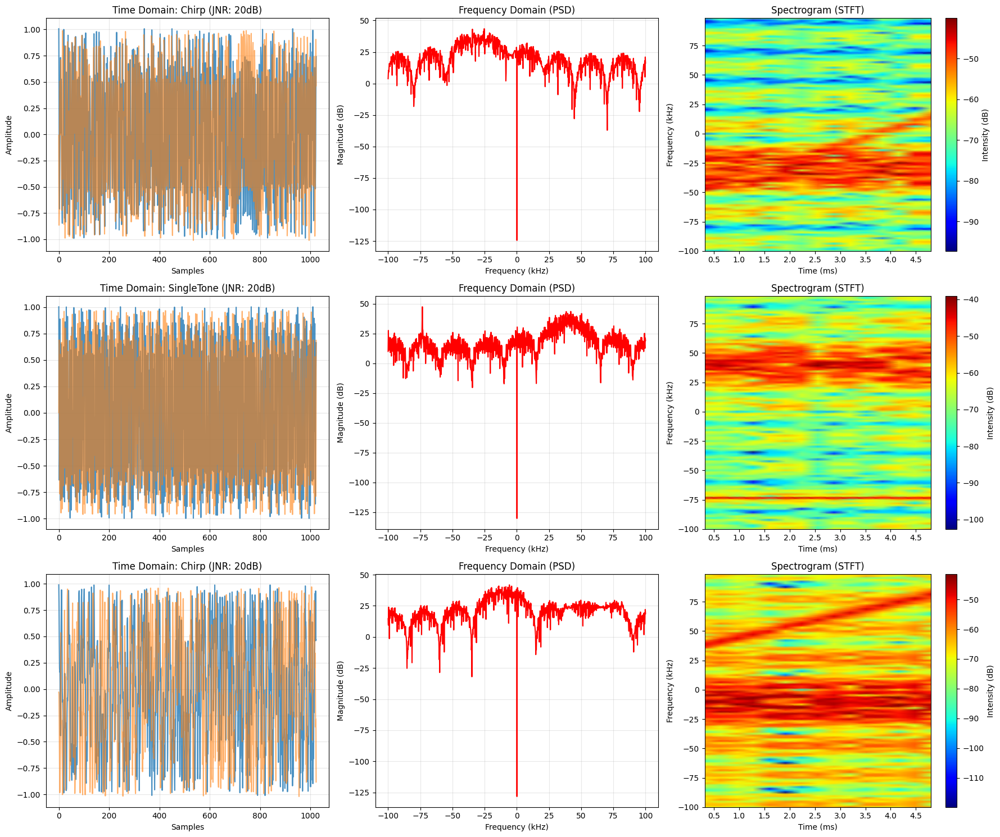

✅ 可视化完成！时频图已保存为 Advanced_Time_Frequency_Analysis.png


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy import signal

def plot_advanced_signal_analysis(data_dir="final_sync_dataset_v4_with_sat", num_samples=3):
    """
    对仿真生成的 .dat 流进行深度时频分析可视化
    """
    # 类别映射
    type_names = ["SingleTone", "Chirp", "Pulse", "HoppingJam", "NoiseFM", "NoiseAM", "Comb", "Mixed", "Normal(Sat)"]
    fs = 200e3
    frame_len = 512 + 32 + 1024  # Sync + Tag + Payload
    
    # 获取 JNR=20dB 的文件作为演示 (通常信号较清晰)
    file_path = os.path.join(data_dir, "tx_stream_jnr_-10.dat")
    if not os.path.exists(file_path):
        print(f"❌ 找不到文件: {file_path}")
        return

    # 读取原始二进制数据
    raw_data = np.fromfile(file_path, dtype=np.complex64)
    
    # 随机抽取几个不同类型的帧进行展示
    # 每个类别有 1000 帧，我们选取不同类别的起始位置
    plt.figure(figsize=(18, 5 * num_samples))

    for i in range(num_samples):
        # 随机选择一个类别索引
        cat_idx = np.random.randint(0, len(type_names))
        # 随机选择该类别下的一帧
        frame_idx = cat_idx * 1000 + np.random.randint(0, 1000)
        
        start = frame_idx * frame_len
        frame = raw_data[start : start + frame_len]
        
        # 提取负载部分 (跳过同步头和标签桩)
        payload = frame[544:] 
        
        # --- 1. 时域波形 ---
        plt.subplot(num_samples, 3, 3*i + 1)
        plt.plot(payload.real, label='I', alpha=0.8)
        plt.plot(payload.imag, label='Q', alpha=0.6)
        plt.title(f"Time Domain: {type_names[cat_idx]} (JNR: 20dB)")
        plt.xlabel("Samples")
        plt.ylabel("Amplitude")
        plt.grid(True, alpha=0.3)

        # --- 2. 功率谱密度 (PSD) ---
        plt.subplot(num_samples, 3, 3*i + 2)
        psd = np.abs(np.fft.fftshift(np.fft.fft(payload, n=1024)))
        psd_db = 20 * np.log10(psd + 1e-12)
        freqs = np.linspace(-fs/2, fs/2, 1024) / 1e3 # kHz
        plt.plot(freqs, psd_db, color='red')
        plt.title(f"Frequency Domain (PSD)")
        plt.xlabel("Frequency (kHz)")
        plt.ylabel("Magnitude (dB)")
        plt.grid(True, alpha=0.3)

        # --- 3. 时频图 (Spectrogram) ---
        plt.subplot(num_samples, 3, 3*i + 3)
        f, t_spec, Sxx = signal.spectrogram(payload, fs, nperseg=128, noverlap=64, return_onesided=False)
        # 调整频率轴顺序以便可视化
        f = np.fft.fftshift(f) / 1e3 # kHz
        Sxx = np.fft.fftshift(Sxx, axes=0)
        
        plt.pcolormesh(t_spec * 1e3, f, 10 * np.log10(Sxx + 1e-12), shading='gouraud', cmap='jet')
        plt.title("Spectrogram (STFT)")
        plt.xlabel("Time (ms)")
        plt.ylabel("Frequency (kHz)")
        plt.colorbar(label='Intensity (dB)')

    plt.tight_layout()
    plt.savefig("Advanced_Time_Frequency_Analysis.png", dpi=300)
    plt.show()
    print("✅ 可视化完成！时频图已保存为 Advanced_Time_Frequency_Analysis.png")

if __name__ == "__main__":
    plot_advanced_signal_analysis()

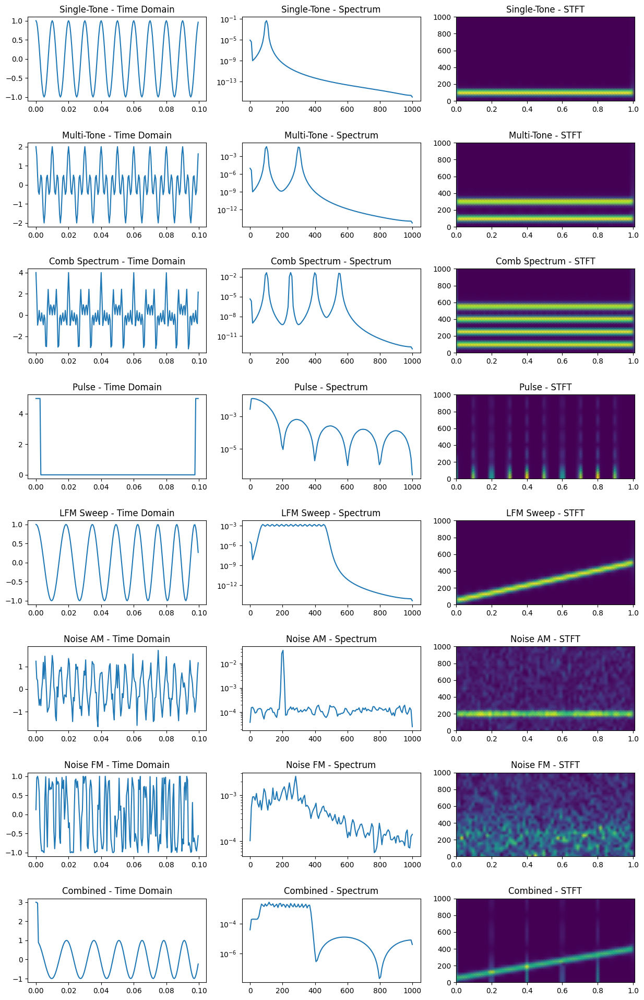

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

def generate_jamming_visuals():
    fs = 2000  # 采样率
    t = np.linspace(0, 1, fs)  # 1秒时长
    num_jam = 8
    
    fig, axes = plt.subplots(num_jam, 3, figsize=(15, 24))
    plt.subplots_adjust(hspace=0.5)

    names = ["Single-Tone", "Multi-Tone", "Comb Spectrum", "Pulse", 
             "LFM Sweep", "Noise AM", "Noise FM", "Combined"]

    for i in range(num_jam):
        # 信号生成逻辑
        if i == 0: # 单音
            j = np.cos(2 * np.pi * 100 * t)
        elif i == 1: # 多音
            j = np.cos(2 * np.pi * 100 * t) + np.cos(2 * np.pi * 300 * t)
        elif i == 2: # 梳状
            j = sum([np.cos(2 * np.pi * (100 + k*150) * t) for k in range(4)])
        elif i == 3: # 脉冲
            j = np.zeros_like(t)
            j[::200] = 5; j = signal.convolve(j, np.ones(10), mode='same')
        elif i == 4: # 扫频
            j = signal.chirp(t, f0=50, f1=500, t1=1, method='linear')
        elif i == 5: # 噪声调幅
            noise = np.random.normal(0, 1, fs)
            j = (1 + 0.5 * noise) * np.cos(2 * np.pi * 200 * t)
        elif i == 6: # 噪声调频
            noise = np.cumsum(np.random.normal(0, 0.1, fs))
            j = np.cos(2 * np.pi * 200 * t + 10 * noise)
        elif i == 7: # 组合 (扫频+脉冲)
            j = signal.chirp(t, f0=50, f1=400, t1=1)
            p = np.zeros_like(t); p[::400] = 2
            j += signal.convolve(p, np.ones(5), mode='same')

        # 1. 时域图
        axes[i, 0].plot(t[:200], j[:200])
        axes[i, 0].set_title(f"{names[i]} - Time Domain")
        
        # 2. 频谱图
        freqs, psd = signal.welch(j, fs, nperseg=256)
        axes[i, 1].semilogy(freqs, psd)
        axes[i, 1].set_title(f"{names[i]} - Spectrum")

        # 3. 时频图 (STFT)
        f, times, Zxx = signal.stft(j, fs, nperseg=64)
        axes[i, 2].pcolormesh(times, f, np.abs(Zxx), shading='gouraud')
        axes[i, 2].set_title(f"{names[i]} - STFT")

    plt.show()

if __name__ == "__main__":
    generate_jamming_visuals()

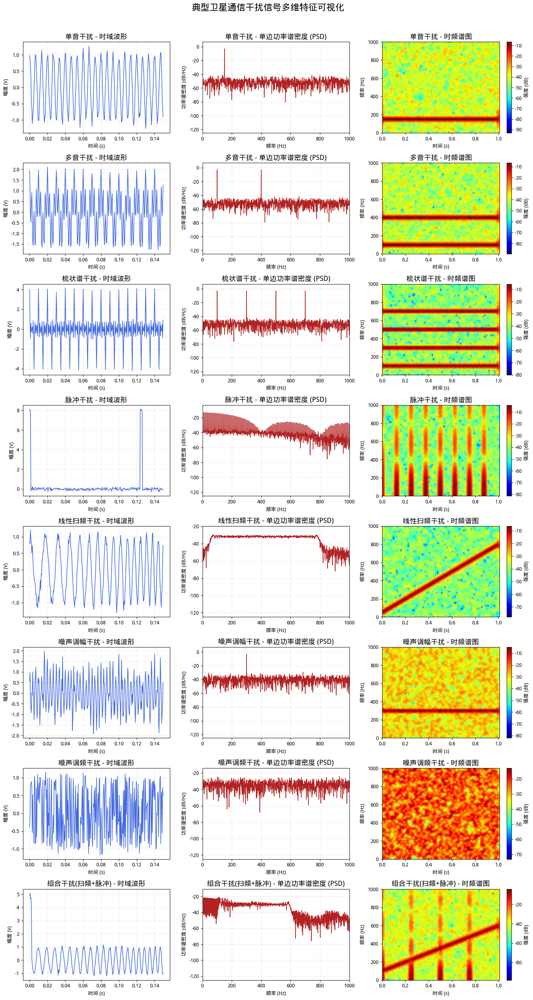

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import matplotlib
from matplotlib import font_manager as fm
import os
# ==================== 0. 中文字体配置 ====================
# ---------------------- 1. 环境配置 ----------------------
def set_chinese_font():
    try:
        font_paths = ['/usr/share/fonts/truetype/wqy/wqy-microhei.ttc',
                      'C:/Windows/Fonts/simhei.ttf',
                      '/System/Library/Fonts/PingFang.ttc']
        for font_path in font_paths:
            if os.path.exists(font_path):
                fm.fontManager.addfont(font_path)
                plt.rcParams['font.family'] = fm.FontProperties(fname=font_path).get_name()
                plt.rcParams['axes.unicode_minus'] = False
                return True
        return False
    except: return False
set_chinese_font()

# ==================== 1. 干扰信号可视化生成函数 ====================
def generate_jamming_visuals_v2():
    fs = 2000.0        # 采样率 2000 Hz
    t_end = 1.0        # 信号时长 1s
    t = np.linspace(0, t_end, int(fs), endpoint=False)
    num_jam = 8
    
    # 创建画布，增加纵向间距以适应中文标签
    fig, axes = plt.subplots(num_jam, 3, figsize=(15, 28))
    plt.subplots_adjust(hspace=0.6, wspace=0.3)

    # 中文名称定义
    names = [
        "单音干扰", "多音干扰", "梳状谱干扰", "脉冲干扰", 
        "线性扫频干扰", "噪声调幅干扰", "噪声调频干扰", "组合干扰(扫频+脉冲)"
    ]

    for i in range(num_jam):
        # --- 信号产生逻辑 (对应论文 2.1 节物理模型) ---
        if i == 0: # 单音
            j = np.cos(2 * np.pi * 150 * t)
        elif i == 1: # 多音 (100Hz + 400Hz)
            j = np.cos(2 * np.pi * 100 * t) + np.cos(2 * np.pi * 400 * t)
        elif i == 2: # 梳状 (等间隔 150Hz)
            j = sum([np.cos(2 * np.pi * (100 + k*200) * t) for k in range(4)])
        elif i == 3: # 脉冲 (占空比极小)
            j = np.zeros_like(t)
            j[::250] = 8.0 # 瞬时强脉冲
            j = signal.convolve(j, np.ones(5), mode='same')
        elif i == 4: # 线性扫频 (50Hz -> 800Hz)
            j = signal.chirp(t, f0=50, f1=800, t1=t_end, method='linear')
        elif i == 5: # 噪声调幅
            noise = np.random.normal(0, 0.5, len(t))
            j = (1 + noise) * np.cos(2 * np.pi * 300 * t)
        elif i == 6: # 噪声调频 (随机频率抖动)
            noise_int = np.cumsum(np.random.normal(0, 0.2, len(t)))
            j = np.cos(2 * np.pi * 200 * t + 20 * noise_int)
        elif i == 7: # 组合干扰 (线性扫频 + 定时脉冲)
            j = signal.chirp(t, f0=100, f1=600, t1=t_end)
            p = np.zeros_like(t); p[::500] = 4.0
            j += signal.convolve(p, np.ones(8), mode='same')

        # 添加少许背景噪声增强真实性
        j += np.random.normal(0, 0.1, len(t))

        # --- A. 时域波形图 (展示前 200 个样点) ---
        show_n = 300
        axes[i, 0].plot(t[:show_n], j[:show_n], color='royalblue', linewidth=1.2)
        axes[i, 0].set_title(f"{names[i]} - 时域波形", fontsize=14)
        axes[i, 0].set_xlabel("时间 (s)")
        axes[i, 0].set_ylabel("幅度 (V)")
        axes[i, 0].grid(True, linestyle=':', alpha=0.6)

        # # --- B. 双边功率谱密度图 (PSD) ---
        # # 使用 fftshift 将 0 频点移动到中心
        # fft_res = np.fft.fft(j)
        # fft_shift = np.fft.fftshift(fft_res)
        # psd = 10 * np.log10(np.abs(fft_shift)**2 / (fs * len(t)) + 1e-12) # 转为 dB
        # freqs = np.fft.fftshift(np.fft.fftfreq(len(t), 1/fs))

        # axes[i, 1].plot(freqs, psd, color='firebrick', linewidth=1)
        # axes[i, 1].set_title(f"{names[i]} - 双边功率谱", fontsize=12)
        # axes[i, 1].set_xlabel("频率 (Hz)")
        # axes[i, 1].set_ylabel("功率谱密度 (dB/Hz)")
        # axes[i, 1].set_xlim(-fs/2, fs/2)
        # axes[i, 1].set_ylim(np.min(psd)-5, np.max(psd)+10)
        # axes[i, 1].grid(True, linestyle=':', alpha=0.6)
        # 2. 单边功率谱密度图 (PSD)
        f_psd, p_den = signal.periodogram(j, fs, scaling='density')
        # 转换为 dB 尺度
        psd_db = 10 * np.log10(p_den + 1e-12)
        axes[i, 1].plot(f_psd, psd_db, color='firebrick', linewidth=1.2)
        axes[i, 1].set_title(f"{names[i]} - 单边功率谱密度 (PSD)", fontsize=14, fontweight='bold')
        axes[i, 1].set_xlabel("频率 (Hz)",)
        axes[i, 1].set_ylabel("功率谱密度 (dB/Hz)")
        axes[i, 1].set_xlim(0, fs/2) # 严格展示单边
        axes[i, 1].set_ylim(np.min(psd_db)-5, np.max(psd_db)+10)
        axes[i, 1].grid(True, linestyle=':', alpha=0.6)

        # --- C. 时频图 (STFT) ---
        f_stft, t_stft, Zxx = signal.stft(j, fs, nperseg=128, noverlap=110)
        # 绘制幅度值的对数形式以便观察弱特征
        stft_show = 20 * np.log10(np.abs(Zxx) + 1e-6)
        
        im = axes[i, 2].pcolormesh(t_stft, f_stft, stft_show, shading='gouraud', cmap='jet')
        axes[i, 2].set_title(f"{names[i]} - 时频谱图", fontsize=14)
        axes[i, 2].set_xlabel("时间 (s)")
        axes[i, 2].set_ylabel("频率 (Hz)")
        # 这里的 Y 轴通常展示单边，若需双边需手动调整 STFT 参数，科研论文通常单边展示正频率部分
        fig.colorbar(im, ax=axes[i, 2], label='强度 (dB)')

    plt.suptitle("典型卫星通信干扰信号多维特征可视化", fontsize=18, fontweight='bold', y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.savefig("干扰特征分析可视化.png", dpi=300) # 保存高分辨率图用于论文
    plt.show()

# ==================== 2. 执行绘图 ====================
if __name__ == "__main__":
    generate_jamming_visuals_v2()

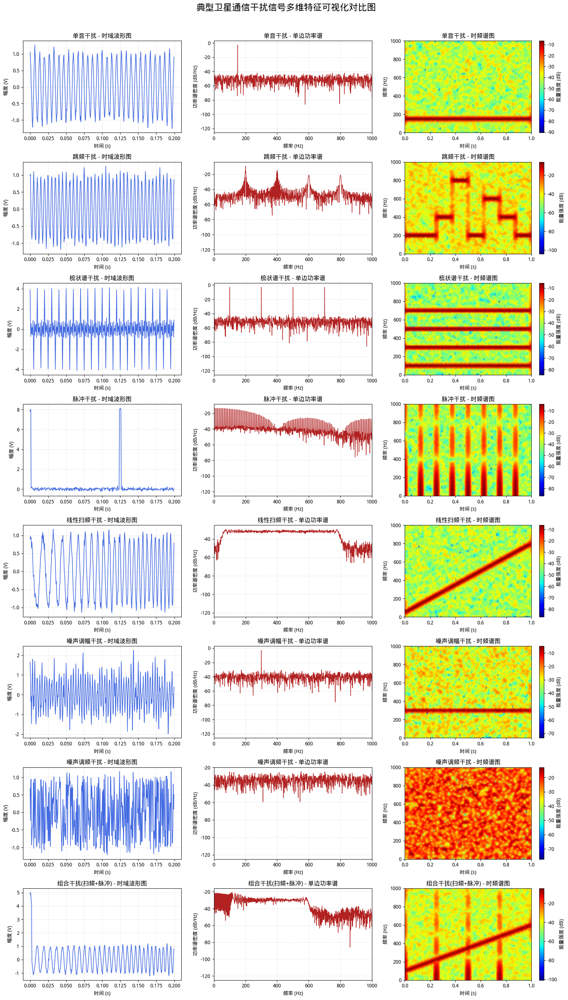

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from matplotlib import font_manager as fm
import os

# ==================== 0. 环境与中文字体配置 ====================
def set_chinese_font():
    """
    配置支持中文的字体，确保科研论文标签正常显示
    """
    try:
        font_paths = ['/usr/share/fonts/truetype/wqy/wqy-microhei.ttc',
                      'C:/Windows/Fonts/simhei.ttf',
                      '/System/Library/Fonts/PingFang.ttc']
        for font_path in font_paths:
            if os.path.exists(font_path):
                fm.fontManager.addfont(font_path)
                plt.rcParams['font.family'] = fm.FontProperties(fname=font_path).get_name()
                plt.rcParams['axes.unicode_minus'] = False
                return True
    except: pass
    return False

set_chinese_font()

# ==================== 1. 干扰信号可视化生成函数 ====================
def generate_jamming_visuals_v3():
    fs = 2000.0         # 采样率 2000 Hz
    t_end = 1.0         # 信号时长 1s
    t = np.linspace(0, t_end, int(fs), endpoint=False)
    num_jam = 8
    
    # 创建画布，设置适合论文插图的尺寸
    fig, axes = plt.subplots(num_jam, 3, figsize=(16, 28))
    plt.subplots_adjust(hspace=0.6, wspace=0.3)

    # 中文名称定义 (已将多音干扰替换为跳频干扰)
    names = [
        "单音干扰", "跳频干扰", "梳状谱干扰", "脉冲干扰", 
        "线性扫频干扰", "噪声调幅干扰", "噪声调频干扰", "组合干扰(扫频+脉冲)"
    ]

    for i in range(num_jam):
        # --- 信号产生逻辑 (对应论文 2.1 节物理模型) ---
        if i == 0:   # 单音
            j = np.cos(2 * np.pi * 150 * t)
        elif i == 1: # 跳频干扰 (随机跳变频率)
            j = np.zeros_like(t)
            hop_duration = 0.125  # 每个频点驻留 0.125s
            num_hops = int(t_end / hop_duration)
            for h in range(num_hops):
                start_idx = int(h * hop_duration * fs)
                end_idx = int((h + 1) * hop_duration * fs)
                rand_freq = np.random.choice([200, 400, 600, 800]) # 随机频点集
                j[start_idx:end_idx] = np.cos(2 * np.pi * rand_freq * t[start_idx:end_idx])
        elif i == 2: # 梳状
            j = sum([np.cos(2 * np.pi * (100 + k*200) * t) for k in range(4)])
        elif i == 3: # 脉冲
            j = np.zeros_like(t)
            j[::250] = 8.0 
            j = signal.convolve(j, np.ones(5), mode='same')
        elif i == 4: # 线性扫频
            j = signal.chirp(t, f0=50, f1=800, t1=t_end, method='linear')
        elif i == 5: # 噪声调幅
            noise = np.random.normal(0, 0.5, len(t))
            j = (1 + noise) * np.cos(2 * np.pi * 300 * t)
        elif i == 6: # 噪声调频
            noise_int = np.cumsum(np.random.normal(0, 0.2, len(t)))
            j = np.cos(2 * np.pi * 200 * t + 20 * noise_int)
        elif i == 7: # 组合干扰
            j = signal.chirp(t, f0=100, f1=600, t1=t_end)
            p = np.zeros_like(t); p[::500] = 4.0
            j += signal.convolve(p, np.ones(8), mode='same')

        # 添加少许环境背景噪声
        j += np.random.normal(0, 0.1, len(t))

        # --- A. 时域波形图 (局部细节展示) ---
        show_n = 400
        axes[i, 0].plot(t[:show_n], j[:show_n], color='royalblue', linewidth=1.2)
        axes[i, 0].set_title(f"{names[i]} - 时域波形图", fontsize=12, fontweight='bold')
        axes[i, 0].set_xlabel("时间 (s)")
        axes[i, 0].set_ylabel("幅度 (V)")
        axes[i, 0].grid(True, linestyle=':', alpha=0.6)

        # --- B. 单边功率谱密度图 (PSD) ---
        f_psd, p_den = signal.periodogram(j, fs, scaling='density')
        psd_db = 10 * np.log10(p_den + 1e-12)
        axes[i, 1].plot(f_psd, psd_db, color='firebrick', linewidth=1)
        axes[i, 1].set_title(f"{names[i]} - 频谱图", fontsize=12, fontweight='bold')
        axes[i, 1].set_xlabel("频率 (Hz)")
        axes[i, 1].set_ylabel("功率谱密度 (dB/Hz)")
        axes[i, 1].set_xlim(0, fs/2,fontsize=12)
        axes[i, 1].grid(True, linestyle=':', alpha=0.6)

        # --- C. 时频分布图 (STFT) ---
        f_stft, t_stft, Zxx = signal.stft(j, fs, nperseg=128, noverlap=115)
        stft_db = 20 * np.log10(np.abs(Zxx) + 1e-6)
        
        # 使用 jet 映射，展现深蓝色背景和能量脊线
        im = axes[i, 2].pcolormesh(t_stft, f_stft, stft_db, shading='gouraud', cmap='jet')
        axes[i, 2].set_title(f"{names[i]} - 时频谱图", fontsize=12, fontweight='bold')
        axes[i, 2].set_xlabel("时间 (s)")
        axes[i, 2].set_ylabel("频率 (Hz)")
        axes[i, 2].set_ylim(0, fs/2)
        
        cbar = fig.colorbar(im, ax=axes[i, 2])
        cbar.set_label('能量强度 (dB)')

    plt.suptitle("典型卫星通信干扰信号多维特征可视化对比图", fontsize=18, fontweight='bold', y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.savefig("干扰特征分析可视化_完整版.png", dpi=300)
    plt.show()

if __name__ == "__main__":
    generate_jamming_visuals_v3()

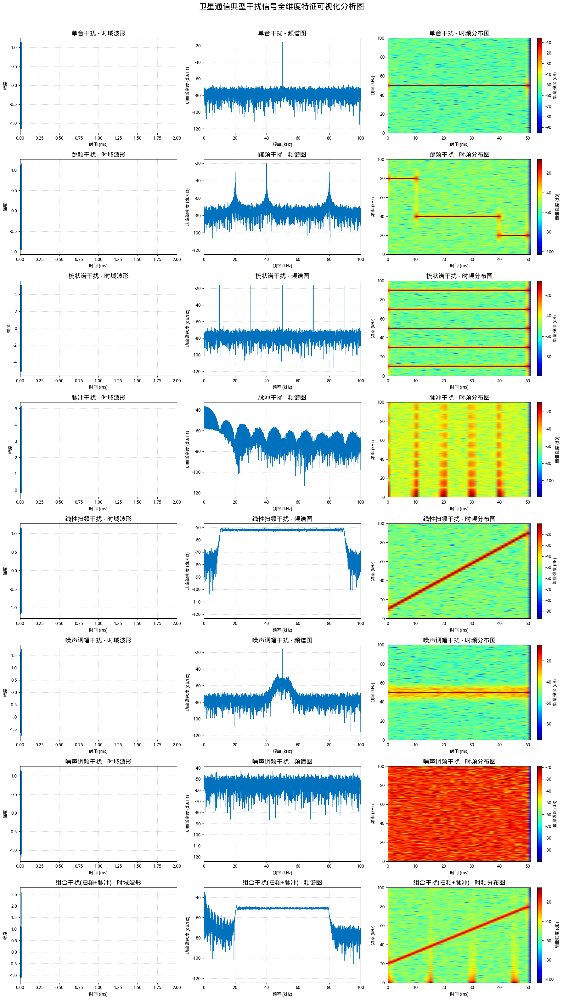

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from matplotlib import font_manager as fm
import os

# ==================== 0. 环境与中文字体配置 ====================
def set_chinese_font():
    """
    配置支持中文的字体，确保科研论文标签正常显示
    """
    try:
        font_paths = ['/usr/share/fonts/truetype/wqy/wqy-microhei.ttc',
                      'C:/Windows/Fonts/simhei.ttf',
                      '/System/Library/Fonts/PingFang.ttc']
        for font_path in font_paths:
            if os.path.exists(font_path):
                fm.fontManager.addfont(font_path)
                plt.rcParams['font.family'] = fm.FontProperties(fname=font_path).get_name()
                plt.rcParams['axes.unicode_minus'] = False
                return True
    except: pass
    return False

set_chinese_font()

# ==================== 1. 干扰信号可视化生成函数 ====================
def generate_jamming_overview():
    fs = 200000.0       # 采样率 200 kHz (匹配卫星L频段子带)
    duration = 0.05     # 信号时长 50 ms
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    num_jam = 8
    
    # 创建画布：8行3列
    fig, axes = plt.subplots(num_jam, 3, figsize=(18, 32))
    plt.subplots_adjust(hspace=0.6, wspace=0.3)

    # 干扰类型定义
    names = [
        "单音干扰", "跳频干扰", "梳状谱干扰", "脉冲干扰", 
        "线性扫频干扰", "噪声调幅干扰", "噪声调频干扰", "组合干扰(扫频+脉冲)"
    ]

    for i in range(num_jam):
        # --- 信号产生逻辑 ---
        if i == 0:   # 单音
            j = np.cos(2 * np.pi * 50000 * t)
        elif i == 1: # 跳频干扰 (每10ms跳变一次频率)
            j = np.zeros_like(t)
            hop_dur = 0.01  # 10ms
            for h in range(5):
                idx = slice(int(h*hop_dur*fs), int((h+1)*hop_dur*fs))
                f_hop = np.random.choice([20000, 40000, 60000, 80000])
                j[idx] = np.cos(2 * np.pi * f_hop * t[idx])
        elif i == 2: # 梳状谱 (间隔20kHz)
            j = sum([np.cos(2 * np.pi * (10000 + k*20000) * t) for k in range(5)])
        elif i == 3: # 脉冲 (占空比极小)
            j = np.zeros_like(t)
            j[::int(0.01*fs)] = 5.0 # 每10ms一个冲击
            j = signal.convolve(j, np.ones(20), mode='same') # 展宽脉冲
        elif i == 4: # 线性扫频 (10kHz -> 90kHz)
            j = signal.chirp(t, f0=10000, f1=90000, t1=duration, method='linear')
        elif i == 5: # 噪声调幅
            b, a = signal.butter(4, 5000/(fs/2), 'low')
            noise = signal.lfilter(b, a, np.random.normal(0, 1, len(t)))
            j = (1 + 0.8 * noise/np.max(np.abs(noise))) * np.cos(2 * np.pi * 50000 * t)
        elif i == 6: # 噪声调频
            b, a = signal.butter(4, 2000/(fs/2), 'low')
            noise = signal.lfilter(b, a, np.random.normal(0, 1, len(t)))
            noise_int = np.cumsum(noise) / fs
            j = np.cos(2 * np.pi * 50000 * t + 2 * np.pi * 15000 * noise_int/np.max(np.abs(noise_int)))
        elif i == 7: # 组合干扰
            j1 = signal.chirp(t, f0=20000, f1=80000, t1=duration, method='linear')
            j2 = np.zeros_like(t)
            j2[np.where((t % 0.015) < 0.0005)] = 1.5
            j = j1 + j2

        # 叠加轻微环境噪声
        j += np.random.normal(0, 0.05, len(t))

        # --- A. 时域波形图 ---
        # show_t = 400 # 转为ms
        axes[i, 0].plot(t[:400], j[:400], color='#0072bd', linewidth=1.0)
        axes[i, 0].set_title(f"{names[i]} - 时域波形", fontsize=14, fontweight='bold')
        axes[i, 0].set_xlabel("时间 (ms)")
        axes[i, 0].set_ylabel("幅度")
        axes[i, 0].set_xlim(0, 2,fontsize=12) # 展示15ms细节
        # axes[i, 0].set_ylim(-1.5, 1.5,fontsize=12)
        axes[i, 0].grid(True, linestyle=':', alpha=0.6)

        # --- B. 单边功率谱密度图 (PSD) ---
        f_psd, p_den = signal.periodogram(j, fs, scaling='density')
        psd_db = 10 * np.log10(p_den + 1e-12)
        axes[i, 1].plot(f_psd / 1000, psd_db, color='#0072bd', linewidth=1)
        axes[i, 1].set_title(f"{names[i]} - 频谱图", fontsize=14, fontweight='bold')
        axes[i, 1].set_xlabel("频率 (kHz)")
        axes[i, 1].set_ylabel("功率谱密度 (dB/Hz)")
        axes[i, 1].set_xlim(0, fs/2000,fontsize=14) # 0-100kHz
        axes[i, 1].set_ylim
        axes[i, 1].grid(True, linestyle=':', alpha=0.6)

        # --- C. 时频图 (STFT) ---
        f_s, t_s, Zxx = signal.stft(j, fs, nperseg=512, noverlap=256)
        stft_db = 20 * np.log10(np.abs(Zxx) + 1e-6)
        
        # 使用 jet 映射，展现深蓝色背景 (蓝色为背景底噪，红/黄色为信号)
        im = axes[i, 2].pcolormesh(t_s * 1000, f_s / 1000, stft_db, shading='gouraud', cmap='jet')
        # im = axes[i, 2].pcolormesh(t_s * 1000, f_s / 1000, stft_db, 
        #                            shading='gouraud', cmap='jet', 
        #                            vmin=-100, vmax=-20)
        axes[i, 2].set_title(f"{names[i]} - 时频分布图", fontsize=14, fontweight='bold')
        axes[i, 2].set_xlabel("时间 (ms)")
        axes[i, 2].set_ylabel("频率 (kHz)")
        axes[i, 2].set_ylim(0, fs/2000)
        
        cbar = fig.colorbar(im, ax=axes[i, 2], fraction=0.046, pad=0.04)
        cbar.set_label('能量强度 (dB)')

    plt.suptitle("卫星通信典型干扰信号全维度特征可视化分析图", fontsize=18, fontweight='bold', y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.savefig("典型干扰信号多维特征总图.png", dpi=600)
    plt.show()

if __name__ == "__main__":
    generate_jamming_overview()

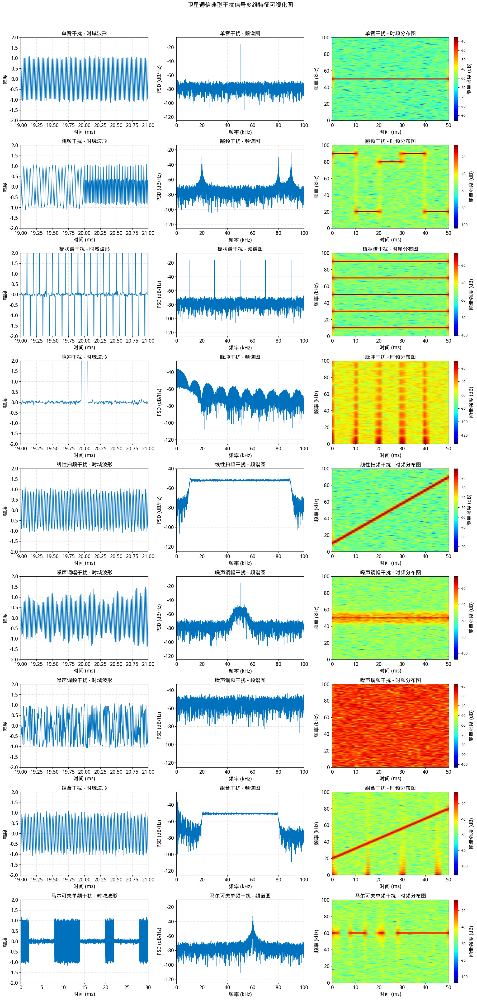

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from matplotlib import font_manager as fm
import os

# ==================== 0. 环境与中文字体配置 ====================
def set_chinese_font():
    """
    配置支持中文的字体，确保科研论文标签正常显示
    """
    try:
        # 常见系统字体路径
        font_paths = ['/usr/share/fonts/truetype/wqy/wqy-microhei.ttc',
                      'C:/Windows/Fonts/simhei.ttf',
                      '/System/Library/Fonts/PingFang.ttc']
        for font_path in font_paths:
            if os.path.exists(font_path):
                fm.fontManager.addfont(font_path)
                plt.rcParams['font.family'] = fm.FontProperties(fname=font_path).get_name()
                plt.rcParams['axes.unicode_minus'] = False
                return True
    except: pass
    return False

set_chinese_font()

# ==================== 1. 干扰信号可视化生成函数 ====================
def generate_jamming_overview():
    fs = 200000.0       # 采样率 200 kHz
    duration = 0.05     # 信号时长 50 ms
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    num_jam = 9
    
    # 创建画布：8行3列
    fig, axes = plt.subplots(num_jam, 3, figsize=(18, 38))
    plt.subplots_adjust(hspace=0.7, wspace=0.3)

    # 干扰类型定义
    names = [
        "单音干扰", "跳频干扰", "梳状谱干扰", "脉冲干扰", 
        "线性扫频干扰", "噪声调幅干扰", "噪声调频干扰", "组合干扰","马尔可夫单频干扰"
    ]

    for i in range(num_jam):
        # --- 信号产生逻辑 (物理模型保持不变) ---
        if i == 0:   # 单音
            j = np.cos(2 * np.pi * 50000 * t)
        elif i == 1: # 跳频干扰 (每10ms跳变一次)
            j = np.zeros_like(t)
            hop_dur = 0.01
            for h in range(5):
                idx = slice(int(h*hop_dur*fs), int((h+1)*hop_dur*fs))
                f_hop = np.random.choice([10000, 90000, 20000, 80000])
                j[idx] = np.cos(2 * np.pi * f_hop * t[idx])
        elif i == 2: # 梳状谱
            j = sum([np.cos(2 * np.pi * (10000 + k*20000) * t) for k in range(5)])
        elif i == 3: # 脉冲
            j = np.zeros_like(t)
            j[::int(0.01*fs)] = 5.0 
            j = signal.convolve(j, np.ones(20), mode='same') 
        elif i == 4: # 线性扫频
            j = signal.chirp(t, f0=10000, f1=90000, t1=duration, method='linear')
        elif i == 5: # 噪声调幅
            b, a = signal.butter(4, 5000/(fs/2), 'low')
            noise = signal.lfilter(b, a, np.random.normal(0, 1, len(t)))
            j = (1 + 0.8 * noise/np.max(np.abs(noise))) * np.cos(2 * np.pi * 50000 * t)
        elif i == 6: # 噪声调频
            b, a = signal.butter(4, 2000/(fs/2), 'low')
            noise = signal.lfilter(b, a, np.random.normal(0, 1, len(t)))
            noise_int = np.cumsum(noise) / fs
            j = np.cos(2 * np.pi * 50000 * t + 2 * np.pi * 15000 * noise_int/np.max(np.abs(noise_int)))
        elif i == 7: # 组合干扰
            j1 = signal.chirp(t, f0=20000, f1=80000, t1=duration, method='linear')
            j2 = np.zeros_like(t)
            j2[np.where((t % 0.015) < 0.0005)] = 1.5
            j = j1 + j2
# ================== 新增：马尔可夫单频干扰 ==================
        elif i == 8: 
            j = np.zeros_like(t)
            state = 1             # 初始状态：1(存在干扰), 0(无干扰)
            p_11 = 0.8            # P11: 保持干扰状态的概率
            p_01 = 0.2            # P01: 从无干扰转为有干扰的概率
            f_markov = 60000      # 干扰固定在 60 kHz 信道
            block_dur = 0.002     # 每 2 ms 进行一次马尔可夫状态判定
            
            # 固定随机种子以保证学术图表的可复现性
            np.random.seed(42)    
            
            for h in range(int(duration / block_dur)):
                # 状态转移判定
                if state == 1:
                    state = 1 if np.random.rand() < p_11 else 0
                else:
                    state = 1 if np.random.rand() < p_01 else 0
                
                # 若状态为1，则在该时间块内填入单频载波
                if state == 1:
                    idx = slice(int(h * block_dur * fs), int((h+1) * block_dur * fs))
                    j[idx] = np.cos(2 * np.pi * f_markov * t[idx])

        # 叠加噪底，使时频图背景呈现深蓝色
        j += np.random.normal(0, 0.05, len(t))

        # --- A. 时域波形图 ---
        show_idx = int(fs * 0.05) # 展示前5ms
        axes[i, 0].plot(t[:show_idx] * 1000, j[:show_idx], color='#0072bd', linewidth=1.0)
        axes[i, 0].set_title(f"{names[i]} - 时域波形", fontsize=14, fontweight='bold')
        axes[i, 0].set_xlabel("时间 (ms)", fontsize=14)
        axes[i, 0].set_ylabel("幅度", fontsize=14)
        axes[i, 0].set_xlim(19, 21) 
        axes[i, 0].set_ylim(-2.0, 2.0)
        axes[i, 0].tick_params(labelsize=14) # 正确设置刻度字体大小的方法
        axes[i, 0].grid(True, linestyle=':', alpha=0.6)

        # 针对不同干扰动态调整时域 x 轴展示范围，确保特征明显
        if i == 8: 
            axes[i, 0].set_xlim(0, 30) # 马尔可夫展示 0-30ms 展现其间歇性“开启-关闭”
        else:
            axes[i, 0].set_xlim(19, 21) # 其他依然保留你原本的细粒度展示 
            
        axes[i, 0].set_ylim(-2.0, 2.0)
        axes[i, 0].tick_params(labelsize=14) 
        axes[i, 0].grid(True, linestyle=':', alpha=0.6)

        # 只展示10–20 ms的片段（包含一次跳变）
        # start_idx = int(0.01 * fs)
        # end_idx = int(0.02 * fs)
        # axes[i, 0].plot(t[start_idx:end_idx]* 1000, j[start_idx:end_idx], color='#0072bd', linewidth=1.5)
        # axes[i, 0].set_xlim(10, 20)  # 时间轴：10–20 ms
        # axes[i, 0].set_ylim(-1.2, 1.2)
        # axes[i, 0].set_title(f"{names[i]} - 时域波形", fontsize=14, fontweight='bold')
        # axes[i, 0].set_xlabel("时间 (ms)", fontsize=14)
        # axes[i, 0].set_ylabel("幅度", fontsize=14)
        # axes[i, 0].set_xlim(0, 30) 
        # axes[i, 0].set_ylim(-2.0, 2.0)
        # axes[i, 0].tick_params(labelsize=14) # 正确设置刻度字体大小的方法
        # axes[i, 0].grid(True, linestyle=':', alpha=0.6)

        # --- B. 功率谱密度图 (PSD) ---
        f_psd, p_den = signal.periodogram(j, fs, scaling='density')
        psd_db = 10 * np.log10(p_den + 1e-12)
        axes[i, 1].plot(f_psd / 1000, psd_db, color='#0072bd', linewidth=1)
        axes[i, 1].set_title(f"{names[i]} - 频谱图", fontsize=14, fontweight='bold')
        axes[i, 1].set_xlabel("频率 (kHz)", fontsize=14)
        axes[i, 1].set_ylabel("PSD (dB/Hz)", fontsize=14)
        axes[i, 1].set_xlim(0, fs/2000)
        axes[i, 1].set_ylim(np.min(psd_db)-5, np.max(psd_db)+10)
        axes[i, 1].tick_params(labelsize=14)
        axes[i, 1].grid(True, linestyle=':', alpha=0.6)

        # --- C. 时频图 (STFT) ---
        # 参照第一段代码风格：使用 jet 映射与合理的 vmin 锁定深蓝背景
        f_s, t_s, Zxx = signal.stft(j, fs, nperseg=512, noverlap=256)
        stft_db = 20 * np.log10(np.abs(Zxx) + 1e-10)
        
        # vmin 设置为 -100 左右可以确保噪底为深蓝色，信号脊线为明亮的红/黄色
        # im = axes[i, 2].pcolormesh(t_s * 1000, f_s / 1000, stft_db, 
        #                            shading='gouraud', cmap='jet', 
        #                            vmin=-100, vmax=-40)
        im = axes[i, 2].pcolormesh(t_s * 1000, f_s / 1000, stft_db, shading='gouraud', cmap='jet')                           
        
        axes[i, 2].set_title(f"{names[i]} - 时频分布图", fontsize=14, fontweight='bold')
        axes[i, 2].set_xlabel("时间 (ms)", fontsize=14)
        axes[i, 2].set_ylabel("频率 (kHz)", fontsize=14)
        axes[i, 2].set_ylim(0, fs/2000)
        axes[i, 2].set_xlim(0, 50) # 展示全时段
        axes[i, 2].tick_params(labelsize=14)
        
        cbar = fig.colorbar(im, ax=axes[i, 2], fraction=0.046, pad=0.04)
        cbar.set_label('能量强度 (dB)', fontsize=14)

    plt.suptitle("卫星通信典型干扰信号多维特征可视化图", fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.savefig("典型干扰信号多维特征总图_科研规范版.png", dpi=600)
    plt.show()

if __name__ == "__main__":
    generate_jamming_overview()